# Vegetable Classification

## Sumber Dataset

https://www.kaggle.com/datasets/misrakahmed/vegetable-image-dataset/code?datasetId=1817999&sortBy=voteCount

# Import Library

In [12]:
import os, shutil
import zipfile
import matplotlib.pyplot as plt
import random
from random import sample
import shutil
from shutil import copyfile
import pathlib
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm as tq

In [5]:
# Import library untuk pemrosesan gambar
import cv2 
from PIL import Image 
import skimage 
from skimage import io 
from skimage.transform import resize
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte 
from skimage.exposure import adjust_gamma
from skimage.util import random_noise

In [6]:
# Import library untuk membangun model
import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import Model, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.layers import InputLayer, Conv2D, SeparableConv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau

In [17]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [18]:
print(tf.__version__)

2.15.0


# Data Loading

## Mendeklarasikan path setiap data

In [19]:
train_path = r"Vegetable Images/train"
test_path = r"Vegetable Images/test"
validation_path = r"Vegetable Images/validation"

combined_path = r"Vegetable Images/combined_dataset"

In [20]:
os.makedirs(combined_path, exist_ok=True)

## Menggabungkan data train, test, dan validation menjadi satu

In [21]:
for category in os.listdir(train_path):
    category_path = os.path.join(train_path, category)
    if os.path.isdir(category_path):
        shutil.copytree(category_path, os.path.join(combined_path, category), dirs_exist_ok=True)

for category in os.listdir(test_path):
    category_path = os.path.join(test_path, category)
    if os.path.isdir(category_path):
        shutil.copytree(category_path, os.path.join(combined_path, category), dirs_exist_ok=True)

for category in os.listdir(validation_path):
    category_path = os.path.join(validation_path, category)
    if os.path.isdir(category_path):
        shutil.copytree(category_path, os.path.join(combined_path, category), dirs_exist_ok=True)

## Menampilkan Setiap Kelas Dataset

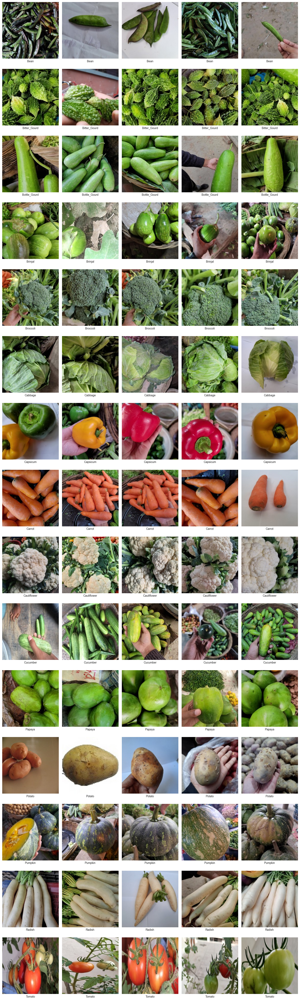

In [22]:
import matplotlib.pyplot as plt

vegetable_images = {}

path = r"Vegetable Images/"
path_sub = os.path.join(path, r"combined_dataset")
for i in os.listdir(path_sub):
    vegetable_images[i] = os.listdir(os.path.join(path_sub, i))

path_sub = r"vegetable Images/combined_dataset"

fig, axs = plt.subplots(len(vegetable_images.keys()), 5, figsize=(15, 50))

for i, class_name in enumerate(os.listdir(path_sub)):
    images = np.random.choice(vegetable_images[class_name], 5, replace=False)

    for j, image_name in enumerate(images):
        img_path = os.path.join(path_sub, class_name, image_name)
        img = Image.open(img_path).convert("RGB")
        axs[i, j].imshow(img, cmap='gray')
        axs[i, j].set(xlabel=class_name, xticks=[], yticks=[])

fig.tight_layout()

## Distribusi Jumlah Kelas Setiap Dataset

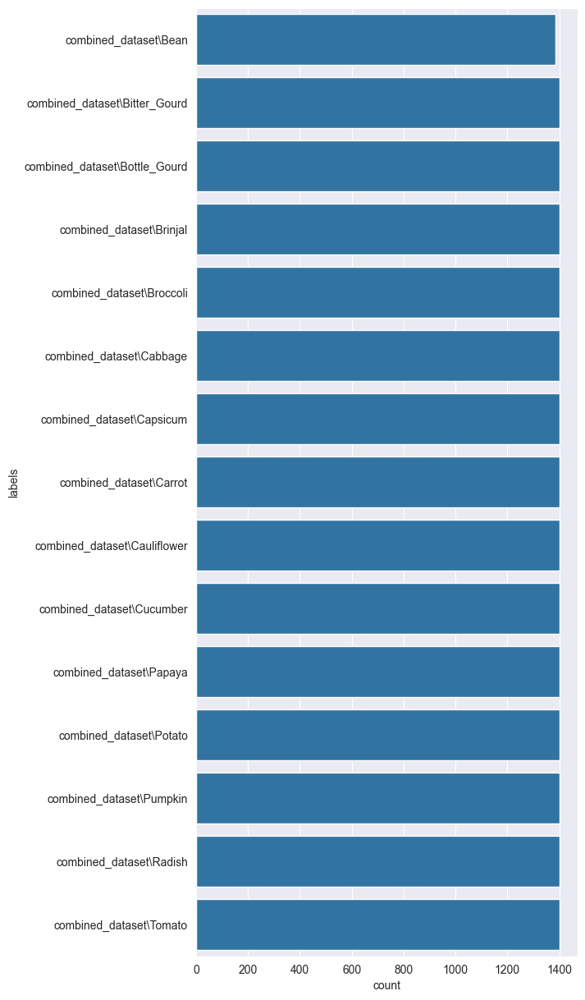

In [23]:
import seaborn as sns

vegetable_path = r"Vegetable Images/combined_dataset"

file_name = []
labels = []
full_path = []

for path, subdirs, files in os.walk(vegetable_path):
    for name in files:
        full_path.append(os.path.join(path, name))
        labels.append(path.split('/')[-1])
        file_name.append(name)

distribution_train = pd.DataFrame({'path': full_path, 'file_name': file_name, 'labels': labels})

Label = distribution_train['labels']
plt.figure(figsize=(6,15))
sns.set_style('darkgrid')
plot_data = sns.countplot(Label)


## Fungsi Untuk Augmentasi

In [24]:
def anticlockwise(img):
    img = cv2.cvtColor(img, 0)
    img = cv2.resize(img, (224, 224))
    sudut = random.randint(0, 180)
    return rotate(img, sudut)

def clockwise_rotation(img):
    img = cv2.cvtColor(img, 0)
    img = cv2.resize(img, (224, 224))
    sudut = random.randint(0, 180)
    return rotate(img, -sudut)

def flip_up_down(img):
    img = cv2.cvtColor(img, 0)
    img = cv2.resize(img, (224, 224))
    return np.flipud(img)

def add_brightness(img):
    img = cv2.cvtColor(img, 0)
    img = cv2.resize(img, (224, 224))
    img = img_adjust_gamma(img, gamma=0.5, gain=1)
    return img

def blur_image(img):
    img = cv2.cvtColor(img, 0)
    img = cv2.resize(img, (224, 224))
    return cv2.GaussianBlur(img, (9,9), 0)

def sheared(img):
    img = cv2.cvtColor(img, 0)
    img = cv2.resize(img, (224, 224))
    transform = AffineTransform(shear=0.2)
    shear_image = warp(img, transform, mode='wrap')
    return shear_image

def warp_shift(img):
    img = cv2.cvtColor(img, 0)
    img = cv2.resize(img, (224, 224))
    transform = AffineTransform(translation=(0, 40))
    warp_image = warp(img, transform, mode='wrap')
    return warp_image

## Melakukan Augmentasi

In [25]:
import os
import shutil
import random
from skimage import io, img_as_ubyte
import cv2

# Pastikan fungsi-fungsi ini sudah didefinisikan sebelumnya
transformations = {
    'rotate anticlockwise': anticlockwise,
    'rotate clockwise': clockwise_rotation,
    'flip up down': flip_up_down,
    'add brightness': add_brightness,
    'blur image': blur_image,
    'sheared': sheared,
    'warp shift': warp_shift
}

base_path = r"Vegetable Images/combined_dataset"
valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff')

for class_name in os.listdir(base_path):
    class_folder = os.path.join(base_path, class_name)
    if not os.path.isdir(class_folder):
        continue

    # Buat folder normal dan augmented
    normal_folder = os.path.join(class_folder, f"{class_name}_Normal")
    augmented_folder = os.path.join(class_folder, f"{class_name}_Augmented")
    os.makedirs(normal_folder, exist_ok=True)
    os.makedirs(augmented_folder, exist_ok=True)

    # Pindahkan semua file gambar ke folder normal
    for file in os.listdir(class_folder):
        file_path = os.path.join(class_folder, file)
        if os.path.isfile(file_path) and file.lower().endswith(valid_extensions):
            shutil.move(file_path, os.path.join(normal_folder, file))

    # Ambil semua file gambar untuk augmentasi
    image_files = [
        os.path.join(normal_folder, f)
        for f in os.listdir(normal_folder)
        if f.lower().endswith(valid_extensions)
    ]

    # Khusus Bean agar jumlahnya sama dengan dataset lain, maka perlu ditambah 14
    total_augments = 114 if class_name.lower() == 'bean' else 100

    i = 1
    while i <= total_augments:
        image_path = random.choice(image_files)
        try:
            original_image = io.imread(image_path)
            transformed_image = original_image.copy()

            # Lakukan beberapa transformasi acak
            transformation_count = random.randint(1, len(transformations))
            for _ in range(transformation_count):
                key = random.choice(list(transformations))
                transformed_image = transformations[key](transformed_image)

            # Simpan hasil augmentasi
            save_path = os.path.join(augmented_folder, f"augmented_image_{i}.jpg")
            transformed_image = img_as_ubyte(transformed_image)
            cv2.imwrite(save_path, transformed_image)
            i += 1

        except Exception as e:
            print(f"Error processing {image_path}: {e}")


Error processing Vegetable Images/combined_dataset\Bean\Bean_Normal\1192.jpg: name 'img_adjust_gamma' is not defined
Error processing Vegetable Images/combined_dataset\Bean\Bean_Normal\1107.jpg: OpenCV(4.10.0) d:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.simd_helpers.hpp:94: error: (-2:Unspecified error) in function '__cdecl cv::impl::`anonymous-namespace'::CvtHelper<struct cv::impl::`anonymous namespace'::Set<3,4,-1>,struct cv::impl::A0x85adec04::Set<3,4,-1>,struct cv::impl::A0x85adec04::Set<0,2,5>,4>::CvtHelper(const class cv::_InputArray &,const class cv::_OutputArray &,int)'
> Unsupported depth of input image:
>     'VDepth::contains(depth)'
> where
>     'depth' is 6 (CV_64F)

Error processing Vegetable Images/combined_dataset\Bean\Bean_Normal\0288.jpg: OpenCV(4.10.0) d:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.simd_helpers.hpp:94: error: (-2:Unspecified error) in function '__cdecl cv::impl::`anonymous-namespace'::CvtHelper<struct cv::imp

## Menggabungkan Dataset

In [26]:
import os
import shutil

base_path = r"Vegetable Images/combined_dataset"
output_path = r"Vegetable Images/dataset_final"

# Buat folder output jika belum ada
os.makedirs(output_path, exist_ok=True)

# Iterasi tiap kelas (Bean, Tomato, dsb.)
for class_name in os.listdir(base_path):
    class_folder = os.path.join(base_path, class_name)
    if not os.path.isdir(class_folder):
        continue

    normal_folder = os.path.join(class_folder, f"{class_name}_Normal")
    augmented_folder = os.path.join(class_folder, f"{class_name}_Augmented")

    # Pastikan kedua folder ada
    if not os.path.exists(normal_folder) or not os.path.exists(augmented_folder):
        print(f"Skipping {class_name}: folder Normal/Augmented tidak ditemukan.")
        continue

    # Buat folder tujuan di combined_final
    combined_class_folder = os.path.join(output_path, class_name)
    os.makedirs(combined_class_folder, exist_ok=True)

    # Salin file dari normal
    for filename in os.listdir(normal_folder):
        src_file = os.path.join(normal_folder, filename)
        dst_file = os.path.join(combined_class_folder, f"normal_{filename}")
        shutil.copy(src_file, dst_file)

    # Salin file dari augmented
    for filename in os.listdir(augmented_folder):
        src_file = os.path.join(augmented_folder, filename)
        dst_file = os.path.join(combined_class_folder, f"aug_{filename}")
        shutil.copy(src_file, dst_file)

    print(f"[✓] {class_name} digabungkan ke combined_final.")


[✓] Bean digabungkan ke combined_final.
[✓] Bitter_Gourd digabungkan ke combined_final.
[✓] Bottle_Gourd digabungkan ke combined_final.
[✓] Brinjal digabungkan ke combined_final.
[✓] Broccoli digabungkan ke combined_final.
[✓] Cabbage digabungkan ke combined_final.
[✓] Capsicum digabungkan ke combined_final.
[✓] Carrot digabungkan ke combined_final.
[✓] Cauliflower digabungkan ke combined_final.
[✓] Cucumber digabungkan ke combined_final.
[✓] Papaya digabungkan ke combined_final.
[✓] Potato digabungkan ke combined_final.
[✓] Pumpkin digabungkan ke combined_final.
[✓] Radish digabungkan ke combined_final.
[✓] Tomato digabungkan ke combined_final.


## Distribusi Dataset Setelah di Augmentasi

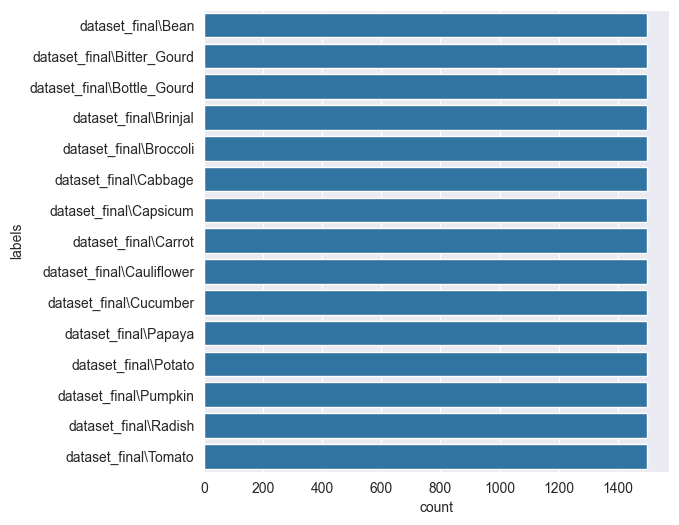

In [27]:
vegetable_path = 'Vegetable Images/dataset_final'

file_name = []
labels = []
full_path = []

for path, subdirs, files in os.walk(vegetable_path):
    for name in files:
        full_path.append(os.path.join(path, name))
        labels.append(path.split('/')[-1])
        file_name.append(name)

distribution_train = pd.DataFrame({'path': full_path, 'file_name': file_name, 'labels': labels})

Label = distribution_train['labels']
plt.figure(figsize = (6,6))
sns.set_style('darkgrid')
plot_data = sns.countplot(Label)

## Data Splitting

In [28]:
my_path = r"Vegetable Images/dataset_final"

file_name = []
labels = []
full_path = []

for path, subdirs, files in os.walk(my_path):
    for name in files:
        full_path.append(os.path.join(path, name))
        labels.append(path.split('/')[-1])
        file_name.append(name)

df = pd.DataFrame({'path':full_path, 'file_name': file_name, 'labels':labels})
df.groupby(['labels']).size()

labels
dataset_final\Bean            1500
dataset_final\Bitter_Gourd    1500
dataset_final\Bottle_Gourd    1500
dataset_final\Brinjal         1500
dataset_final\Broccoli        1500
dataset_final\Cabbage         1500
dataset_final\Capsicum        1500
dataset_final\Carrot          1500
dataset_final\Cauliflower     1500
dataset_final\Cucumber        1500
dataset_final\Papaya          1500
dataset_final\Potato          1500
dataset_final\Pumpkin         1500
dataset_final\Radish          1500
dataset_final\Tomato          1500
dtype: int64

In [29]:
df

,path,file_name,labels
0,Vegetable Images/dataset_final\Bean\aug_augmen...,aug_augmented_image_1.jpg,dataset_final\Bean
1,Vegetable Images/dataset_final\Bean\aug_augmen...,aug_augmented_image_10.jpg,dataset_final\Bean
2,Vegetable Images/dataset_final\Bean\aug_augmen...,aug_augmented_image_100.jpg,dataset_final\Bean
3,Vegetable Images/dataset_final\Bean\aug_augmen...,aug_augmented_image_101.jpg,dataset_final\Bean
4,Vegetable Images/dataset_final\Bean\aug_augmen...,aug_augmented_image_102.jpg,dataset_final\Bean
...,...,...,...
22495,Vegetable Images/dataset_final\Tomato\normal_1...,normal_1396.jpg,dataset_final\Tomato
22496,Vegetable Images/dataset_final\Tomato\normal_1...,normal_1397.jpg,dataset_final\Tomato
22497,Vegetable Images/dataset_final\Tomato\normal_1...,normal_1398.jpg,dataset_final\Tomato
22498,Vegetable Images/dataset_final\Tomato\normal_1...,normal_1399.jpg,dataset_final\Tomato


In [30]:
# Variabel yang digunakan pada pemisahan data ini di mana variabel x = data path dan y = data labels
 
X = df['path']
y = df['labels']

# Tahap 1: Split train (80%) dan temp (20%)
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.2, random_state=300, stratify=y
)

# Tahap 2: Split temp (20%) menjadi validation (10%) dan test (10%)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=300, stratify=y_temp
)

In [31]:
df_train = pd.DataFrame({'path': X_train, 'labels': y_train, 'set': 'train'})
df_test = pd.DataFrame({'path': X_test, 'labels': y_test, 'set': 'test'})
df_val = pd.DataFrame({'path': X_val, 'labels': y_val, 'set': 'val'})

In [32]:
df_all = pd.concat([df_train, df_test, df_val], ignore_index=True)

print('===================================================== \n')
print(df_all.groupby(['set', 'labels']).size(), '\n')
print('===================================================== \n')
 
# Cek sampel data
print(df_all.sample(5))
 
# Memanggil dataset asli yang berisi keseluruhan data gambar yang sesuai dengan labelnya
datasource_path = "Vegetable Images/dataset_final/"
# Membuat variabel Dataset, tempat menampung data yang telah dilakukan pembagian data training dan testing
dataset_path = "Dataset-Final/"


set    labels                    
test   dataset_final\Bean             150
       dataset_final\Bitter_Gourd     150
       dataset_final\Bottle_Gourd     150
       dataset_final\Brinjal          150
       dataset_final\Broccoli         150
       dataset_final\Cabbage          150
       dataset_final\Capsicum         150
       dataset_final\Carrot           150
       dataset_final\Cauliflower      150
       dataset_final\Cucumber         150
       dataset_final\Papaya           150
       dataset_final\Potato           150
       dataset_final\Pumpkin          150
       dataset_final\Radish           150
       dataset_final\Tomato           150
train  dataset_final\Bean            1200
       dataset_final\Bitter_Gourd    1200
       dataset_final\Bottle_Gourd    1200
       dataset_final\Brinjal         1200
       dataset_final\Broccoli        1200
       dataset_final\Cabbage         1200
       dataset_final\Capsicum        1200
       dataset_final\Carrot          1200

In [33]:
!pip install ipywidgets

In [34]:
from tqdm.notebook import tqdm 

## Mengelompokkan Dataset

In [35]:
from tqdm import tqdm

for index, row in tqdm(df_all.iterrows(), total=len(df_all)):
    # Deteksi filepath
    file_path = row['path']
    if not os.path.exists(file_path):
        file_path = os.path.join(datasource_path, row['labels'], row['image'].split('.')[0])

    # Buat direktori tujuan
    dest_folder = os.path.join(dataset_path, row['set'], row['labels'])
    os.makedirs(dest_folder, exist_ok=True)

    # Tentukan tujuan file
    destination_file_name = os.path.basename(file_path)
    file_dest = os.path.join(dest_folder, destination_file_name)

    # Salin file jika belum ada
    if not os.path.exists(file_dest):
        shutil.copy2(file_path, file_dest)


100%|██████████| 22500/22500 [02:41<00:00, 139.49it/s]


In [7]:
TRAIN_DIR = 'Dataset-Final/train/dataset_final'
TEST_DIR = 'Dataset-Final/test/dataset_final'
VAL_DIR = 'Dataset-Final/val/dataset_final'

# List semua label yang tersedia (otomatis dari train dir)
labels = os.listdir(TRAIN_DIR)

# Simpan semua path per label dalam dict
train_paths = {}
test_paths = {}
val_paths = {}

for label in labels:
    train_paths[label] = os.path.join(TRAIN_DIR, label)
    test_paths[label] = os.path.join(TEST_DIR, label)
    val_paths[label] = os.path.join(VAL_DIR, label)

In [37]:
train_paths

{'Bean': 'Dataset-Final/train/dataset_final\\Bean',
 'Bitter_Gourd': 'Dataset-Final/train/dataset_final\\Bitter_Gourd',
 'Bottle_Gourd': 'Dataset-Final/train/dataset_final\\Bottle_Gourd',
 'Brinjal': 'Dataset-Final/train/dataset_final\\Brinjal',
 'Broccoli': 'Dataset-Final/train/dataset_final\\Broccoli',
 'Cabbage': 'Dataset-Final/train/dataset_final\\Cabbage',
 'Capsicum': 'Dataset-Final/train/dataset_final\\Capsicum',
 'Carrot': 'Dataset-Final/train/dataset_final\\Carrot',
 'Cauliflower': 'Dataset-Final/train/dataset_final\\Cauliflower',
 'Cucumber': 'Dataset-Final/train/dataset_final\\Cucumber',
 'Papaya': 'Dataset-Final/train/dataset_final\\Papaya',
 'Potato': 'Dataset-Final/train/dataset_final\\Potato',
 'Pumpkin': 'Dataset-Final/train/dataset_final\\Pumpkin',
 'Radish': 'Dataset-Final/train/dataset_final\\Radish',
 'Tomato': 'Dataset-Final/train/dataset_final\\Tomato'}

In [8]:
datagen = ImageDataGenerator(rescale = 1/255, validation_split = 0.2)
test_datagen = ImageDataGenerator(rescale = 1/255)

train_generator = datagen.flow_from_directory(TRAIN_DIR, batch_size = 32, target_size=(224,224), class_mode='categorical', subset='training', shuffle=True)
validation_generator = datagen.flow_from_directory(VAL_DIR, batch_size = 32, target_size=(224,224), class_mode='categorical', subset='training', shuffle=False)
test_generator = test_datagen.flow_from_directory(TEST_DIR, batch_size = 1, target_size=(224,224), class_mode='categorical', shuffle=False)

Found 14400 images belonging to 15 classes.
Found 1800 images belonging to 15 classes.
Found 2250 images belonging to 15 classes.


# Modeling

In [41]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(2, 2),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(2, 2),
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(15, activation='softmax')
])

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       

In [42]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
import os

# Ambil label dari folder Dataset-Final/train/
train_label_dir = 'Dataset-Final/train/dataset_final'
class_labels = os.listdir(train_label_dir)

# Buat daftar semua label untuk seluruh gambar
y_train_labels = []

for label in class_labels:
    path = os.path.join(train_label_dir, label)
    count = len(os.listdir(path))
    y_train_labels.extend([label] * count)

# Hitung class weights otomatis
class_weights_values = compute_class_weight(
    class_weight='balanced',
    classes=np.array(class_labels),
    y=np.array(y_train_labels)
)

# Konversi ke dictionary
class_weights = {
    i: class_weights_values[i]
    for i in range(len(class_labels))
}

print("Class Weights:", class_weights)


Class Weights: {0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0, 5: 1.0, 6: 1.0, 7: 1.0, 8: 1.0, 9: 1.0, 10: 1.0, 11: 1.0, 12: 1.0, 13: 1.0, 14: 1.0}


## Training Dataset

In [44]:
early_stopping = keras.callbacks.EarlyStopping(patience=3) 
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss', 
    factor=0.2,         
    patience=2,         
    min_lr=1e-6,        
    verbose=1
)
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])
history_1 = model.fit(train_generator, 
                 epochs=100, 
                 verbose=1, 
                 validation_data=validation_generator, 
                 callbacks=early_stopping)

Epoch 1/100
450/450 [==============================] - 196s 434ms/step - loss: 0.0868 - accuracy: 0.9775 - val_loss: 0.1673 - val_accuracy: 0.9689
Epoch 2/100
450/450 [==============================] - 195s 433ms/step - loss: 0.0563 - accuracy: 0.9849 - val_loss: 0.1261 - val_accuracy: 0.9694
Epoch 3/100
450/450 [==============================] - 195s 434ms/step - loss: 0.0532 - accuracy: 0.9852 - val_loss: 0.1587 - val_accuracy: 0.9628
Epoch 4/100
450/450 [==============================] - 193s 429ms/step - loss: 0.0628 - accuracy: 0.9811 - val_loss: 0.2140 - val_accuracy: 0.9583
Epoch 5/100
450/450 [==============================] - 193s 429ms/step - loss: 0.0572 - accuracy: 0.9837 - val_loss: 0.1551 - val_accuracy: 0.9672


## Plot Hasil Training

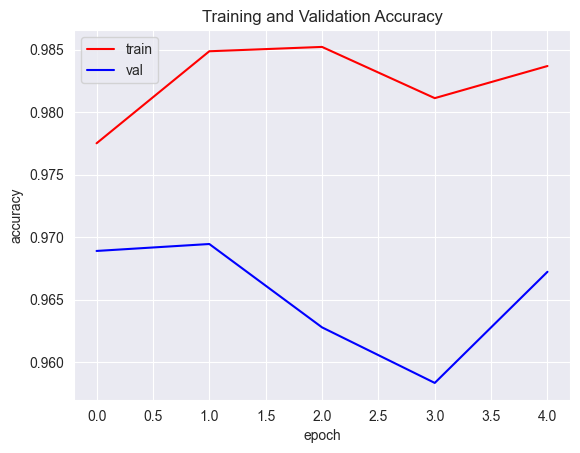

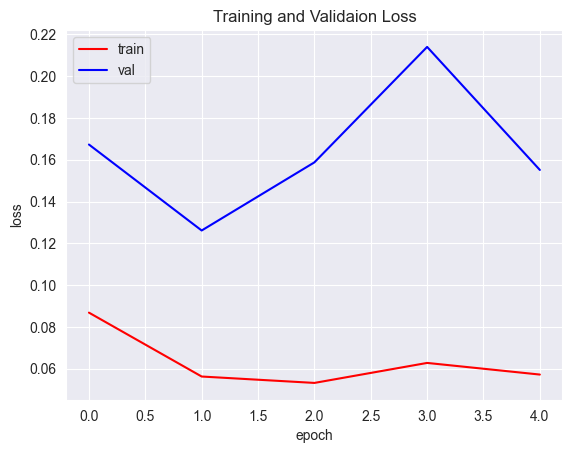

In [45]:
acc = history_1.history['accuracy']
val_acc = history_1.history['val_accuracy']
loss = history_1.history['loss']
val_loss = history_1.history['val_loss']
 
epochs = range(len(acc))
 
plt.plot(epochs, acc, 'r')
plt.plot(epochs, val_acc, 'b')
plt.title('Training and Validation Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
 
plt.plot(epochs, loss, 'r')
plt.plot(epochs, val_loss, 'b')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.title('Training and Validaion Loss')
plt.show()

## Evaluasi Model Pada Testing Set

In [10]:
test_loss, test_accuracy = model.evaluate(test_generator)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

2250/2250 [==============================] - 18s 8ms/step - loss: 3.2346 - accuracy: 0.9138
Test Loss: 3.2346
Test Accuracy: 91.38%


2250/2250 [==============================] - 17s 8ms/step


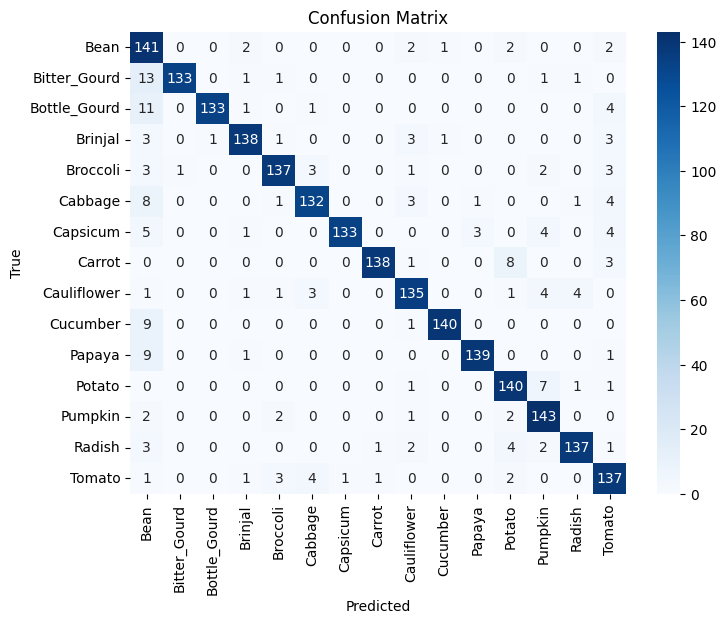

Classification Report:

              precision    recall  f1-score   support

        Bean       0.67      0.94      0.79       150
Bitter_Gourd       0.99      0.89      0.94       150
Bottle_Gourd       0.99      0.89      0.94       150
     Brinjal       0.95      0.92      0.93       150
    Broccoli       0.94      0.91      0.93       150
     Cabbage       0.92      0.88      0.90       150
    Capsicum       0.99      0.89      0.94       150
      Carrot       0.99      0.92      0.95       150
 Cauliflower       0.90      0.90      0.90       150
    Cucumber       0.99      0.93      0.96       150
      Papaya       0.97      0.93      0.95       150
      Potato       0.88      0.93      0.91       150
     Pumpkin       0.88      0.95      0.91       150
      Radish       0.95      0.91      0.93       150
      Tomato       0.84      0.91      0.88       150

    accuracy                           0.91      2250
   macro avg       0.92      0.91      0.92      2250
we

In [ ]:
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

y_true = test_generator.classes

class_labels = list(test_generator.class_indices.keys())

cm = confusion_matrix(y_true, y_pred_classes)

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

print("Classification Report:\n")
print(classification_report(y_true, y_pred_classes, target_names=class_labels))


Jumlah prediksi salah untuk kelas 'bean': 9


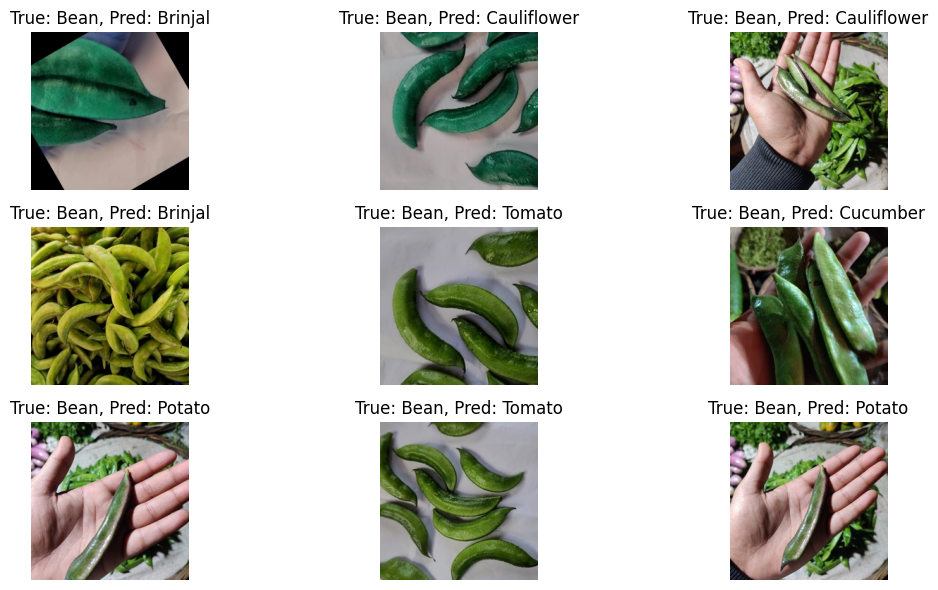

In [26]:
# Nama kelas
class_labels = list(test_generator.class_indices.keys())
inv_class_indices = {v: k for k, v in test_generator.class_indices.items()}
bean_index = test_generator.class_indices['Bean']

# Ambil path file gambar
file_paths = test_generator.filepaths

# Cari indeks di mana kelas sebenarnya adalah 'bean' dan prediksi salah
wrong_indices = [i for i in range(len(y_true)) 
                 if y_true[i] == bean_index and y_pred_classes[i] != bean_index]

print(f"Jumlah prediksi salah untuk kelas 'bean': {len(wrong_indices)}")

# Tampilkan beberapa gambar prediksi salah untuk kelas 'bean'
plt.figure(figsize=(12, 6))
for idx, wrong_idx in enumerate(wrong_indices[:9]):
    img = plt.imread(file_paths[wrong_idx])
    plt.subplot(3, 3, idx + 1)
    plt.imshow(img)
    true_label = inv_class_indices[y_true[wrong_idx]]
    pred_label = inv_class_indices[y_pred_classes[wrong_idx]]
    plt.title(f"True: {true_label}, Pred: {pred_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Menyimpan Model

In [46]:
model.save("saved_model/my_model")

INFO:tensorflow:Assets written to: saved_model/my_model\assets


INFO:tensorflow:Assets written to: saved_model/my_model\assets


In [ ]:
# Konversi ke TFLite
converter = tf.lite.TFLiteConverter.from_saved_model("saved_model/my_model")
tflite_model = converter.convert()

# Simpan ke file .tflite
with open("model.tflite", "wb") as f:
    f.write(tflite_model)

In [59]:
model.save("model.h5")

c:\Users\taqiy\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
